# **En este colab se explica cómo trabajar con SSD**

## **¿Qué es SSD?**

[Enlace al paper original](https://www.cs.utoronto.ca/~bonner/courses/2020s/csc2547/papers/discriminative/object-detection/ssd,-liu,-eccv-2016.pdf)

**SSD (Single Shot MultiBox Detector)** esun modelo avanzado de detección de objetos diseñado para proporcionar una combinación de precisión y velocidad.

SSD pertenece a la familia de **modelos de detección de una sola etapa**, lo que implica que realiza tanto la predición de las bounding boxes como la clasificación de los objetos en una única pasada a través de la red. Esto lo diferencia de modelos de dos etapas, como Faster R-CNN, que generan propuestas iniciales y posteriormente refinan las predicciones en una segunda fase.

### **Principios de funcionamiento**

1. **Detección en una sola etapa**

  SSD fusiona la detección de bounding boxes y la clasificación en una única operación.

  Para ello, utiliza directamente los mapas de características extraídos del backbone de la red y realiza predicciones en múltiples niveles, optimizando tanto la rapidez como la simplicidad arquitectónica.

  <font color = grey> Nota: Backbone → Parce central de una Neural Network encargada de extraer representaciones jerárquicas y significativas de los datos de entrada, generalmente mediante capas convolucionales. </font>

2. **Predicciones multiescala:**

  Una de las características distintivas de SSD es el uso de múltiples mapas de características a diferentes escalas para detectar objetos de diferentes tamaños. Esto se logra extendiendo el backbone con capas convolucionales adicionales que disminuyen progresivamente la resolución espacial.
  Las capas con resoluciones más altas detectan objetos pequeños, mientras que las capas de menor resolución manejan objetos más grandes.

3. **Cajas delimitadoras**

  En cada ubicación del mapa de característicaas, SSD genera un conjunto de cajas predeterminadas con diferentes tamaños, relaciones de aspecto y posiciones iniciales. Estas cajas actúan como hipótesis iniciales para las detecciones.

  Durante el entrenamiento, las cajas predeterminadas se ajustan para coincidir con los objetos reales en las imagenes mediante la predicción de desplazamientos y escalas.

4. **Regresión y clasificación conjunta**

  Para cada caja predeterminada, SSD predice:

    - Las coordenadas ajustadas de la bounding box
    - Las puntuaciones de confianza para cada clase de objeto

  Estas predicciones se realizan mediante capas convolucionales que aplican regresión para las coordenadas y clasificacioón para las clases.

5. **Mecanismo de pérdida**

  SSD utiliza una función de pérdida compuesta que combina:

    - *Smooth L1 loss* para los desplazamientos de las cajas predichas
    - *Categorical cross-entropy* para la clasificación

  Además, se implementa una estrategia de hard negative mining para equilibrar el sesgo inherente de las clases, debido a la gran cantidad de cajas predeterminadas negativas (sin objetos).
  
Imagen comparativa entre YOLO y SSD del paper original [Enlace al paper original](https://www.cs.utoronto.ca/~bonner/courses/2020s/csc2547/papers/discriminative/object-detection/ssd,-liu,-eccv-2016.pdf)


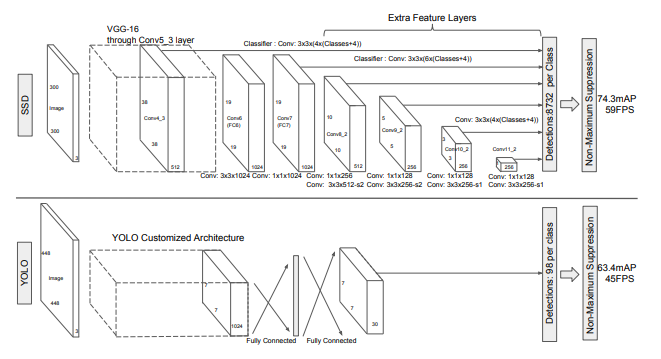

## **Aquí presento una demo de hacer OD con SSD**

[Enlace a documentación oficial de PyTorch](https://pytorch.org/hub/nvidia_deeplearningexamples_ssd/)

In [1]:
# %pip install numpy scipy scikit-image matplotlib

Dependencias

In [2]:
import matplotlib.pyplot as plt
from PIL import Image
import torch
import shutil
import os
import xml.etree.ElementTree as ET
from PIL import Image, ImageDraw
from torchvision import transforms
import xmltodict
from glob import glob
import cv2
from torchvision.transforms import functional as F
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch.nn as nn

Utilizamos `torch.hub.load` para cargar un modelo preentrenado de SSD y una serie de utilidades asociadas directamente desde un repositorio remoto de Pytorch Hub

In [3]:
ssd_model = torch.hub.load('NVIDIA/DeepLearningExamples:torchhub', 'nvidia_ssd')              # Cargamos el modelo preentrenado
utils = torch.hub.load('NVIDIA/DeepLearningExamples:torchhub', 'nvidia_ssd_processing_utils') # Cargamos los utils para procesar los datos

Using cache found in /home/azapata/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub
/home/azapata/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/home/azapata/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/home/azapata/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Detection/SSD/ssd/entrypoints.py:201: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/S

Ponemos el modelo en GPU y comprobamos que se haya descargado bien

In [4]:
ssd_model.to('cuda')
ssd_model.eval()

SSD300(
  (feature_extractor): ResNet(
    (feature_extractor): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplac

Descargamos el dataset de roboflow

[Enlace al dataset](https://universe.roboflow.com/gdit/aerial-airport/dataset/1#)

Preparamos las imagenes de input para object detection (personal, cambiar paths, clave de api...)

In [5]:
# # %pip install roboflow

# from roboflow import Roboflow
# rf = Roboflow(api_key="960y09ZjV5CBktncNnFK")
# project = rf.workspace("gdit").project("aerial-airport")
# version = project.version(1)
# dataset = version.download("voc")

# # Directorio actual del dataset
# source_path = '/mnt/homeGPU/azapata/Aerial-Airport-1'

# # Nueva ubicación donde deseas moverlo
# destination_path = '/mnt/homeGPU/azapata/ZapataComputerVision/content'

# # Asegúrate de que el directorio de destino exista, si no, créalo
# os.makedirs(destination_path, exist_ok=True)

# # Mover la carpeta
# shutil.move(source_path, os.path.join(destination_path, 'Aerial-Airport-1'))

# print(f"Dataset movido de {source_path} a {os.path.join(destination_path, 'Aerial-Airport-1')}")                

Mostramos imagenes para comprobar que hemos cargado correctamente el dataset

La estructura de carpetas ha de ser la siguiente (formato Pascal VOC XML):

Content/ Aerial-Airport-1

    - Test
        im1.jpg & im1.xml
        im2.jpg & im2.xml
        ...
    - Train
        im10.jpg & im10.xml
        im20.jpg & im20.xml
        ...
    - Val
        im100.jpg & im100.xml
        im200.jpg & im200.xml
        ...


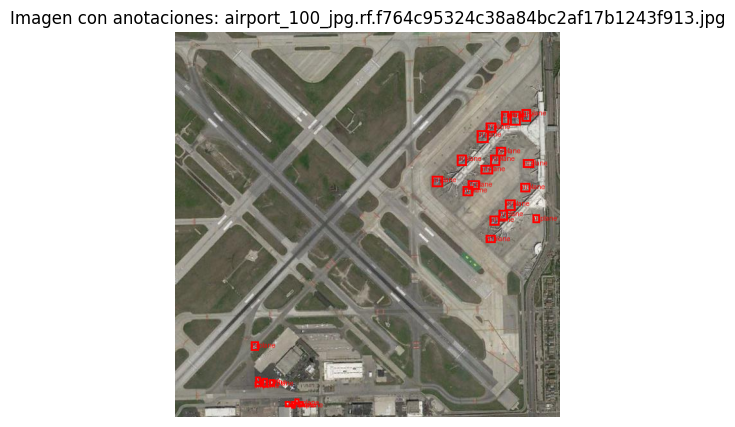

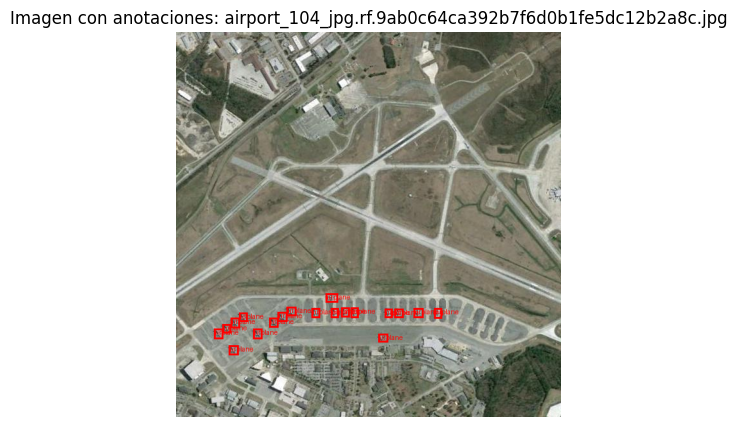

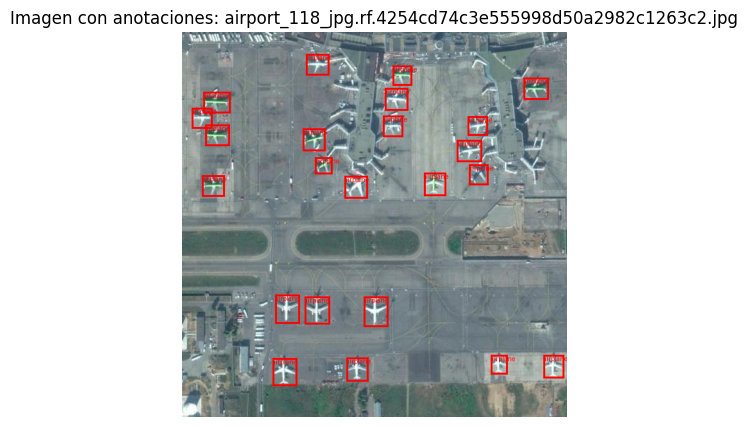

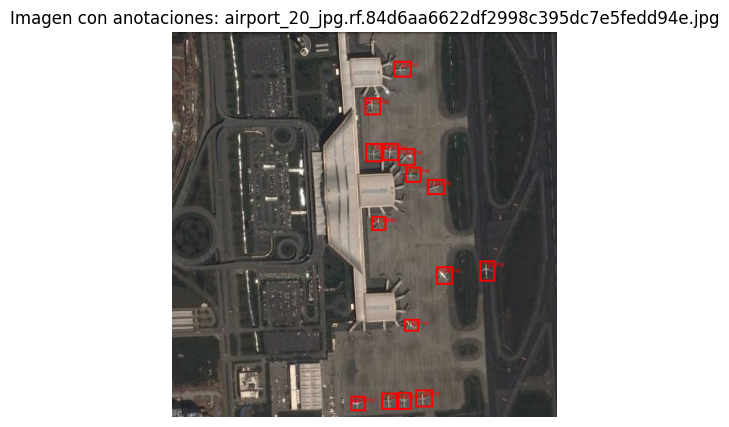

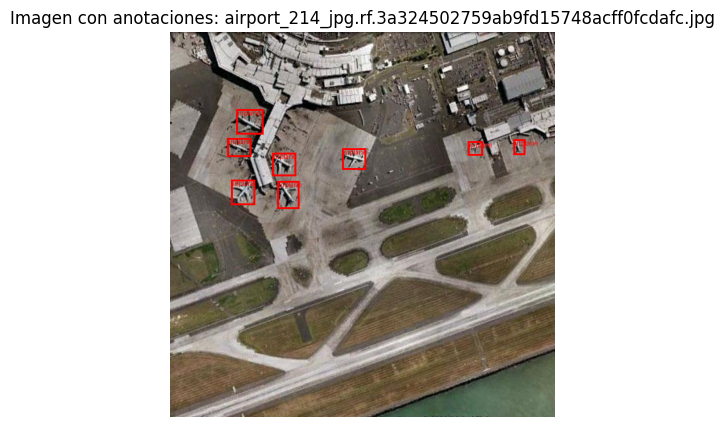

In [6]:
image_dir = "/mnt/homeGPU/azapata/ZapataComputerVision/content/Aerial-Airport-1/test"

image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]  # Filtrar solo imágenes

for image_file in image_files[:5]:  # Procesar las primeras 5 imágenes
    # Ruta de la imagen
    image_path = os.path.join(image_dir, image_file)
    img = Image.open(image_path)

    # Ruta del archivo XML correspondiente
    annotation_file = os.path.join(image_dir, os.path.splitext(image_file)[0] + '.xml')
    
    # Verificar si la anotación existe antes de intentar procesarla
    if not os.path.exists(annotation_file):
        print(f"Anotación no encontrada para {image_file}. Saltando...")
        continue
    
    # Parsear el archivo XML
    tree = ET.parse(annotation_file)
    root = tree.getroot()

    # Dibujar las bounding boxes
    draw = ImageDraw.Draw(img)
    for obj in root.findall('object'):
        label = obj.find('name').text
        bndbox = obj.find('bndbox')
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)

        # Dibujar la caja y añadir el label
        draw.rectangle([xmin, ymin, xmax, ymax], outline='red', width=3)
        draw.text((xmin, ymin), label, fill='red')

    # Mostrar la imagen con bounding boxes
    plt.figure(figsize=(5, 5))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Imagen con anotaciones: {image_file}")
    plt.show()


### **Preprocesamiento de imagenes y etiquetas (esto solo sirve para cuando queremos entrenar SSD con nuestros datos, ya que para hacer inferencia con transformar nuestra imagen a tensor nos basta (y eso viene en utils))**

In [7]:
# %pip install xmltodict opencv-python-headless

**Función para Parsear las Anotaciones XML**

Convierte las anotaciones XML de Pascal VOC a un formato procesable ==> Una lista de diccionarios.

In [8]:
def parse_voc_annotation(annotation_path):
    """Parsea un archivo XML en formato Pascal VOC."""
    with open(annotation_path, 'r') as file:
        data = xmltodict.parse(file.read())
    
    if 'object' not in data['annotation']:
        return []  # Si no hay objetos, devuelve una lista vacía
    
    objects = data['annotation']['object']
    if not isinstance(objects, list):  # Si solo hay un objeto, convierte en lista
        objects = [objects]

    annotations = []
    for obj in objects:
        bbox = obj['bndbox']
        try:
            annotations.append({
                'class': obj['name'],
                'xmin': int(bbox['xmin']),
                'ymin': int(bbox['ymin']),
                'xmax': int(bbox['xmax']),
                'ymax': int(bbox['ymax'])
            })
        except KeyError as e:
            print(f"Error en el archivo {annotation_path}: {e}")
    return annotations


**Procesamos todas las anotaciones**
Recorremos las carpetas de los datasets y extraemos las anotaciones

In [9]:
'''
Con esta función, dado un directorio con imágenes y etiquetas en formato Pascal VOC XML
devolvemos una lista de diccionarios en la que tenemos las imagenes con sus etiquetas en el formato que requiere SSD:
annotations = [
    {
        'image_path': "/ruta/image1.jpg",
        'annotations': [
            {'airplane': 'airplane', 'xmin': 100, 'ymin': 200, 'xmax': 400, 'ymax': 600},
            {'airplane': 'car', 'xmin': 50, 'ymin': 100, 'xmax': 150, 'ymax': 200}
        ]
    },
    ....
    ....
]
'''

def load_annotations(image_dir):
    image_paths = glob(os.path.join(image_dir, "*.jpg"))
    annotations = []

    for image_path in image_paths:
        xml_path = image_path.replace(".jpg", ".xml")
        if os.path.exists(xml_path):
            parsed = parse_voc_annotation(xml_path)
            if parsed:  # Asegurar que no está vacío
                annotations.append({
                    'image_path': image_path,
                    'annotations': parsed
                })
            else:
                print(f"No hay anotaciones para {image_path}")
    return annotations


Creamos las listas de diccionarios correspondientes a las etiquetas de las imagenes en el formato requerido por SSD

In [10]:
train_annotations = load_annotations('/mnt/homeGPU/azapata/ZapataComputerVision/content/Aerial-Airport-1/train')
val_annotations = load_annotations('/mnt/homeGPU/azapata/ZapataComputerVision/content/Aerial-Airport-1/valid')
test_annotations = load_annotations('/mnt/homeGPU/azapata/ZapataComputerVision/content/Aerial-Airport-1/test')

# Imprime las primeras anotaciones para cada conjunto
print(f"Anotaciones de entrenamiento: {train_annotations[:5]}")
print(f"Anotaciones de validación: {val_annotations[:5]}")
print(f"Anotaciones de prueba: {test_annotations[:5]}")

No hay anotaciones para /mnt/homeGPU/azapata/ZapataComputerVision/content/Aerial-Airport-1/train/airport_76_jpg.rf.73b87ee641eb9762b3b091c88116a71f.jpg
No hay anotaciones para /mnt/homeGPU/azapata/ZapataComputerVision/content/Aerial-Airport-1/train/airport_177_jpg.rf.e7a1df01d7f66ffc82ffb0afbf07c404.jpg
No hay anotaciones para /mnt/homeGPU/azapata/ZapataComputerVision/content/Aerial-Airport-1/train/airport_168_jpg.rf.7b2cf5d9c2b4aa8033cd40c42366f6eb.jpg
No hay anotaciones para /mnt/homeGPU/azapata/ZapataComputerVision/content/Aerial-Airport-1/train/airport_168_jpg.rf.62886a19b6e8b100a2b96e8c7b592a6e.jpg
No hay anotaciones para /mnt/homeGPU/azapata/ZapataComputerVision/content/Aerial-Airport-1/train/airport_76_jpg.rf.834c0cc4fd113a5d3ac0c816315de18a.jpg
No hay anotaciones para /mnt/homeGPU/azapata/ZapataComputerVision/content/Aerial-Airport-1/train/airport_177_jpg.rf.b81d4e0b59a6f9adcc1bb7a6fc4d339d.jpg
No hay anotaciones para /mnt/homeGPU/azapata/ZapataComputerVision/content/Aerial-Air

## Verificamos que se vean bien las nuevas etiquetas en formato Pascal VOC xml

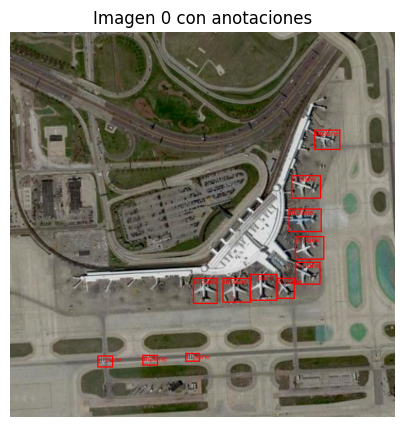

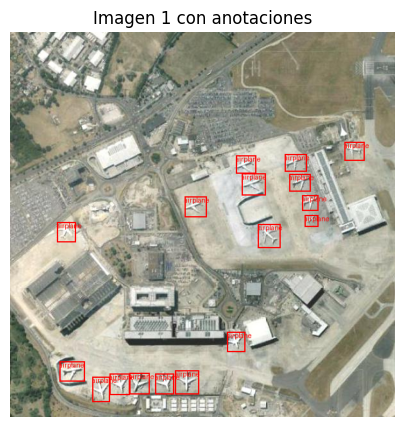

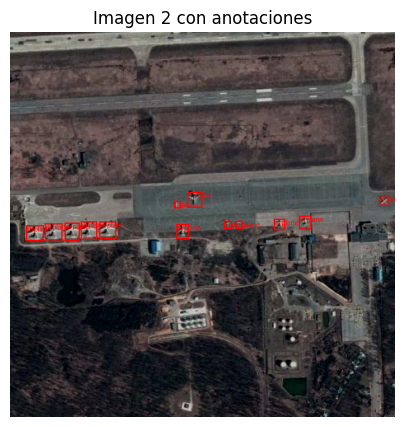

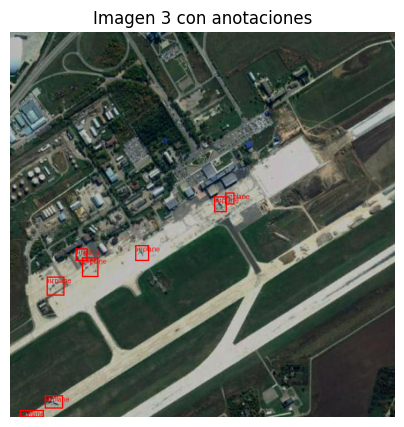

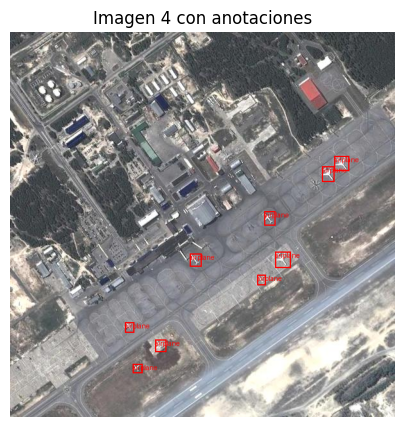

In [11]:
for i, annotation in enumerate(train_annotations[:5]):
    image_path = annotation['image_path']
    image = Image.open(image_path)
    
    draw = ImageDraw.Draw(image)
    for bbox in annotation['annotations']:
        xmin, ymin, xmax, ymax = bbox['xmin'], bbox['ymin'], bbox['xmax'], bbox['ymax']
        draw.rectangle([xmin, ymin, xmax, ymax], outline='red', width=2)
        draw.text((xmin, ymin), bbox['class'], fill='red')
    
    # Mostrar la imagen
    plt.figure(figsize=(5, 5))
    plt.imshow(image)
    plt.axis('off')
    plt.title(f"Imagen {i} con anotaciones")
    plt.show()


Observamos como hay imagenes sin aviones (o sin objects etiquetados) / como son pocas, no las tenemos en cuenta

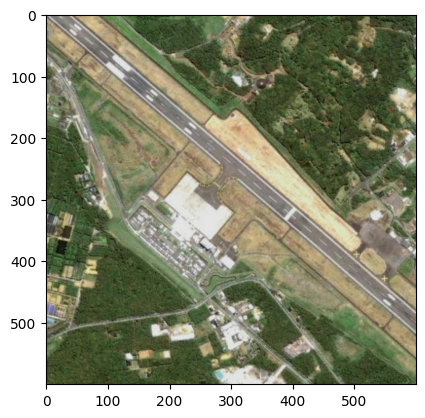

In [12]:
image_path = "/mnt/homeGPU/azapata/ZapataComputerVision/content/Aerial-Airport-1/train/airport_177_jpg.rf.b81d4e0b59a6f9adcc1bb7a6fc4d339d.jpg"

img = Image.open(image_path)

plt.imshow(img)

**Transformar a tensores**

Preparamos las imagenes y etiquetas para que sean compatibles con el modelo SSD

In [13]:
def prepare_tensor(image_path, annotations):
    """Convierte la imagen y las anotaciones a tensores."""
    # Cargar imagen y normalizar
    image = plt.imread(image_path)
    image = image / 255.0
    image_tensor = F.to_tensor(image)

    # Escalar las coordenadas del bbox a [0,1]
    height, width, _ = image.shape
    boxes = []
    labels = []
    for ann in annotations:
        print(f"Procesando: {ann}")  # Debug
        boxes.append([
            ann['xmin'] / width, ann['ymin'] / height,
            ann['xmax'] / width, ann['ymax'] / height
        ])
        labels.append(ann['class'])  

    # Convertir a tensores
    boxes_tensor = torch.tensor(boxes, dtype=torch.float32)
    labels_tensor = torch.tensor(labels)  
    return image_tensor, boxes_tensor, labels_tensor


**Creamos un dataset compatible**

In [14]:
def collate_fn(batch):
    images, targets = zip(*batch)
    return list(images), list(targets)

# Creamos la clase para definir el Dataset

In [15]:
class AerialDataset(Dataset):
    def __init__(self, annotations, classes_to_ids, transform=None):
        self.annotations = annotations
        self.classes_to_ids = classes_to_ids
        self.transform = transform

    def __len__(self):
        return len(self.annotations)

    def __getitem__(self, idx):
        data = self.annotations[idx]
        image_path = data['image_path']
        annotations = data['annotations']
        
        # Cargar imagen
        image = Image.open(image_path).convert("RGB")
        
        # Obtener dimensiones antes de la transformación
        original_width, original_height = image.size
        
        # Aplicar transformaciones
        if self.transform:
            image = self.transform(image)  # Ahora es un tensor
        
        # Obtener dimensiones después de la transformación
        _, transformed_height, transformed_width = image.shape
        
        # Normalizar bounding boxes
        boxes = []
        labels = []
        for ann in annotations:
            boxes.append([
                ann['xmin'] / original_width, 
                ann['ymin'] / original_height,
                ann['xmax'] / original_width, 
                ann['ymax'] / original_height
            ])
            labels.append(self.classes_to_ids[ann['class']])
        
        boxes_tensor = torch.tensor(boxes, dtype=torch.float32)
        labels_tensor = torch.tensor(labels, dtype=torch.int64)
        
        return image, {"boxes": boxes_tensor, "labels": labels_tensor}

    
# Crear mapeo de clases a IDs
classes_to_ids = {'airplane': 1}  # Cambia según tus clases

# Crear transformaciones
resize_transform = transforms.Compose([
    transforms.ToTensor()           # Convertir a tensor
])

# Crear datasets con transformaciones
train_dataset = AerialDataset(train_annotations, classes_to_ids, transform=resize_transform)
val_dataset = AerialDataset(val_annotations, classes_to_ids, transform=resize_transform)
test_dataset = AerialDataset(test_annotations, classes_to_ids, transform=resize_transform)

Verificamos que los datasets se vean bien

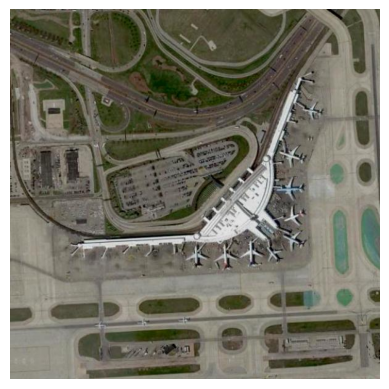

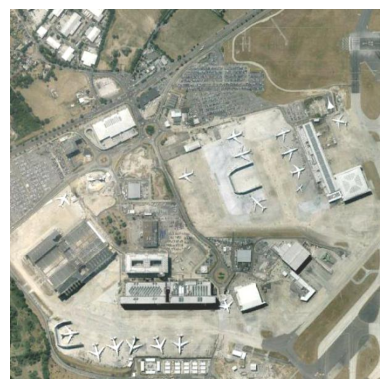

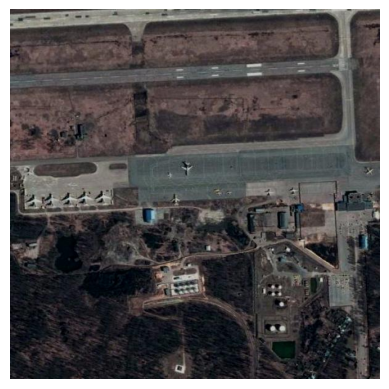

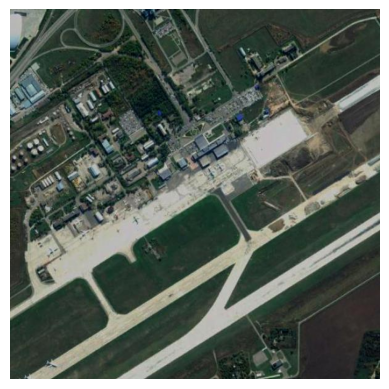

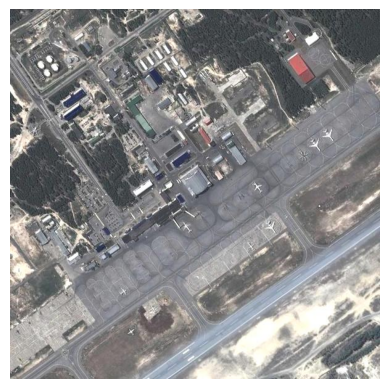

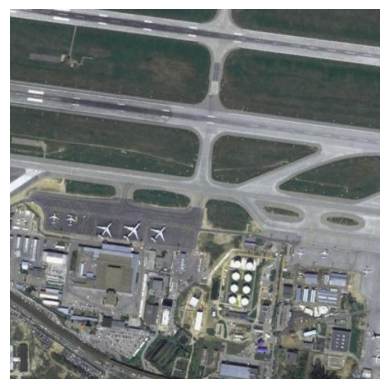

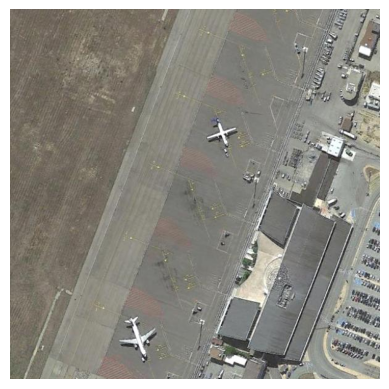

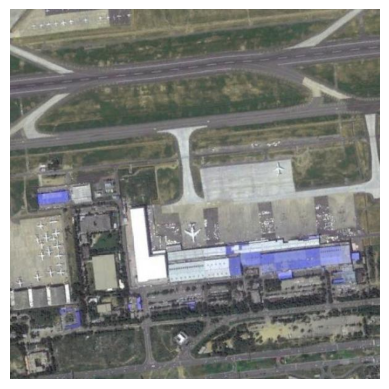

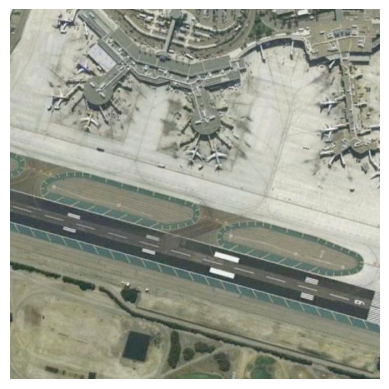

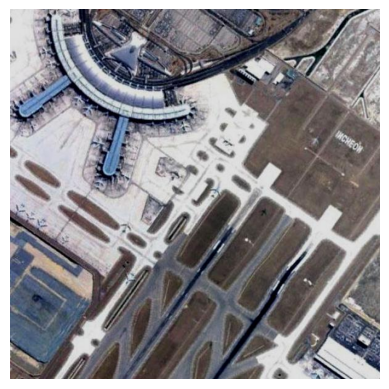

In [16]:
for i in range(10):
    img_path = train_dataset.annotations[i]['image_path']
    img = plt.imread(img_path)
    plt.imshow(img)
    plt.axis('off')
    plt.show()
    plt.close()


In [17]:
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=collate_fn)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, collate_fn=collate_fn)
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False, collate_fn=collate_fn)

Comprobamos que se haya hecho todo correctamente

Contenido exacto del lote: ([tensor([[[0.3020, 0.2863, 0.2588,  ..., 0.1529, 0.1412, 0.1333],
         [0.2902, 0.2667, 0.2314,  ..., 0.1529, 0.1490, 0.1490],
         [0.2549, 0.2235, 0.1843,  ..., 0.1529, 0.1569, 0.1569],
         ...,
         [0.2078, 0.2078, 0.2118,  ..., 0.1725, 0.1843, 0.1765],
         [0.2000, 0.2039, 0.2078,  ..., 0.2000, 0.1725, 0.1255],
         [0.2000, 0.2000, 0.2039,  ..., 0.2157, 0.1608, 0.0863]],

        [[0.2824, 0.2667, 0.2353,  ..., 0.1098, 0.0980, 0.0902],
         [0.2706, 0.2471, 0.2078,  ..., 0.1098, 0.1059, 0.1059],
         [0.2353, 0.2039, 0.1608,  ..., 0.1098, 0.1137, 0.1137],
         ...,
         [0.1843, 0.1843, 0.1882,  ..., 0.1529, 0.1647, 0.1569],
         [0.1765, 0.1804, 0.1843,  ..., 0.1804, 0.1529, 0.1059],
         [0.1765, 0.1765, 0.1804,  ..., 0.1961, 0.1412, 0.0667]],

        [[0.2706, 0.2549, 0.2353,  ..., 0.1255, 0.1137, 0.1059],
         [0.2588, 0.2353, 0.2078,  ..., 0.1255, 0.1216, 0.1216],
         [0.2235, 0.1922, 0.1

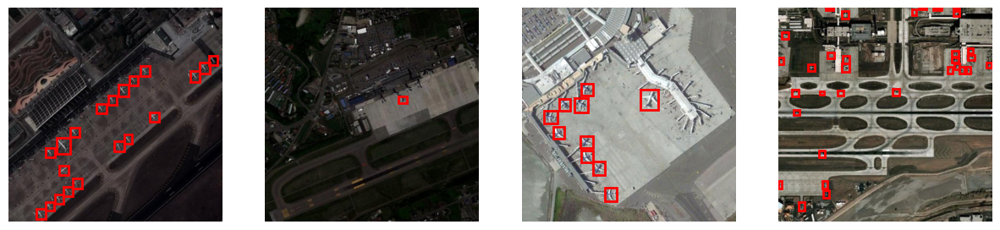

In [18]:
def show_batch(data_batch):
    images, targets = data_batch
    fig, axs = plt.subplots(1, len(images), figsize=(15, 5))
    ids_to_classes = {v: k for k, v in train_dataset.classes_to_ids.items()}

    for i, (image_tensor, target) in enumerate(zip(images, targets)):
        ax = axs[i]
        image = image_tensor.permute(1, 2, 0).detach().cpu().numpy()
        height, width, _ = image.shape
        boxes = target["boxes"].detach().cpu().numpy()
        labels = target["labels"].detach().cpu().numpy()

        print(f"Bounding Boxes para la imagen {i}: {boxes}")
        ax.imshow(image)
        for box, label in zip(boxes, labels):
            x_min, y_min, x_max, y_max = box * [width, height, width, height]
            rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                     linewidth=2, edgecolor='red', facecolor='none')
            ax.add_patch(rect)
            # ax.text(x_min, y_min - 10, ids_to_classes[label],
            #         color='white', fontsize=8, bbox=dict(facecolor='red', alpha=0.5))
        ax.axis("off")

    plt.show()


# Verificar el DataLoader
data_iter = iter(train_loader)
batch = next(data_iter)

print(f"Contenido exacto del lote: {batch}")
print(f"Número de imágenes en el lote: {len(batch[0])}")
print(f"Tamaño de una imagen: {batch[0][0].shape}")
print(f"Targets del primer ejemplo: {batch[1][0]}")

# Mostrar el lote
show_batch(batch)

## **Inferencia en datos de test**

Realizamos inferencia re imágenes de test uitilizando el modelo SSD preentrenado.

In [19]:
# Diccionario para almacenar resultados
all_results = []

# Procesar todas las imágenes del conjunto de test
for annotation in test_annotations:
    # Obtener ruta de la imagen
    image_path = annotation['image_path']
    img = utils.prepare_input(image_path)  # Prepara la imagen
    img_tensor = utils.prepare_tensor([img]).to('cuda')  # Convertir a tensor y mover a GPU

    with torch.no_grad():
        # Realizar inferencia
        detections = ssd_model(img_tensor)

        # Decodificar y filtrar resultados
        decoded = utils.decode_results(detections)
        best_results_per_input = [utils.pick_best(results, 0.1) for results in decoded]

        # Extraer bounding boxes, labels y scores
        boxes = best_results_per_input[0][0]
        labels = best_results_per_input[0][1]
        scores = best_results_per_input[0][2]

        # Validar bounding boxes
        if boxes.shape[1] != 4:
            raise ValueError(f"Unexpected shape for boxes: {boxes.shape}")

        valid_boxes = (boxes[:, 2] > boxes[:, 0]) & (boxes[:, 3] > boxes[:, 1])
        boxes = boxes[valid_boxes]
        scores = scores[valid_boxes]
        labels = labels[valid_boxes]

        # Guardar los resultados en el diccionario
        all_results.append({
            'image_path': image_path,
            'boxes': boxes,  # Mover a CPU y convertir a numpy
            'labels': labels,
            'scores': scores
        })

# Imprimir un resumen de los resultados
print(f"Procesadas {len(all_results)} imágenes.")

Procesadas 34 imágenes.


In [20]:
for result in all_results:
    print(f"Image: {result['image_path']}")
    print(f"Boxes: {result['boxes']}")
    print(f"Labels: {result['labels']}")
    print(f"Scores: {result['scores']}")

Image: /mnt/homeGPU/azapata/ZapataComputerVision/content/Aerial-Airport-1/test/airport_100_jpg.rf.f764c95324c38a84bc2af17b1243f913.jpg
Boxes: []
Labels: []
Scores: []
Image: /mnt/homeGPU/azapata/ZapataComputerVision/content/Aerial-Airport-1/test/airport_104_jpg.rf.9ab0c64ca392b7f6d0b1fe5dc12b2a8c.jpg
Boxes: []
Labels: []
Scores: []
Image: /mnt/homeGPU/azapata/ZapataComputerVision/content/Aerial-Airport-1/test/airport_118_jpg.rf.4254cd74c3e555998d50a2982c1263c2.jpg
Boxes: [[1.2168556e-02 2.8312206e-03 9.9962628e-01 1.0070655e+00]
 [4.4734776e-04 4.9936882e-01 2.2153048e-01 5.9031016e-01]
 [7.2486699e-01 4.9809238e-01 9.5514309e-01 5.8774233e-01]]
Labels: [ 7 72 54]
Scores: [0.10927114 0.2315906  0.2579731 ]
Image: /mnt/homeGPU/azapata/ZapataComputerVision/content/Aerial-Airport-1/test/airport_20_jpg.rf.84d6aa6622df2998c395dc7e5fedd94e.jpg
Boxes: [[ 6.9024277e-01  4.1149408e-03  7.6290715e-01  2.0501673e-01]
 [-5.0556064e-03  1.7279387e-04  1.0129495e+00  1.0023015e+00]]
Labels: [40  7]


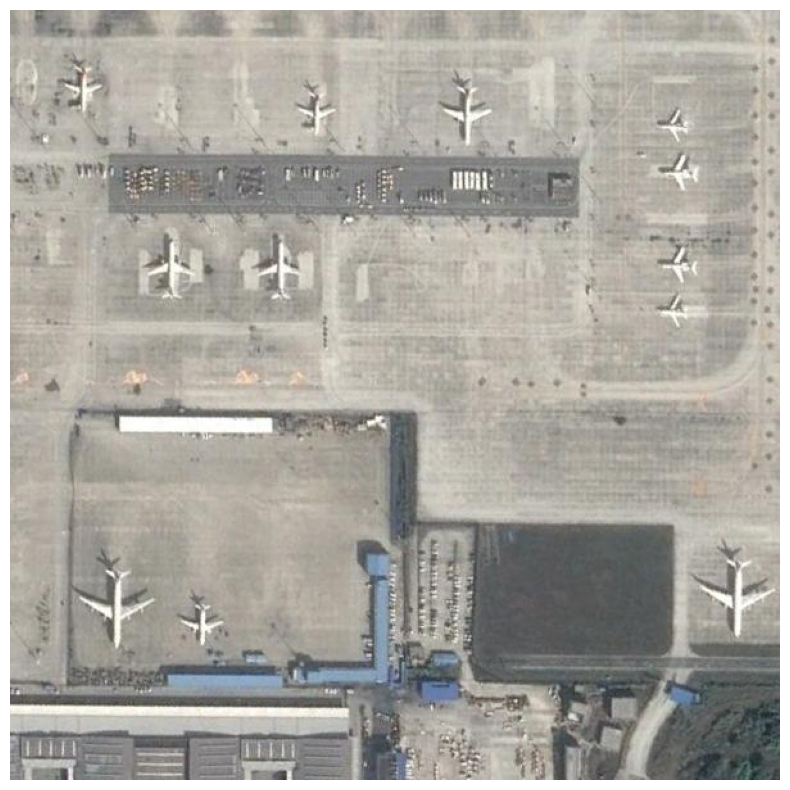

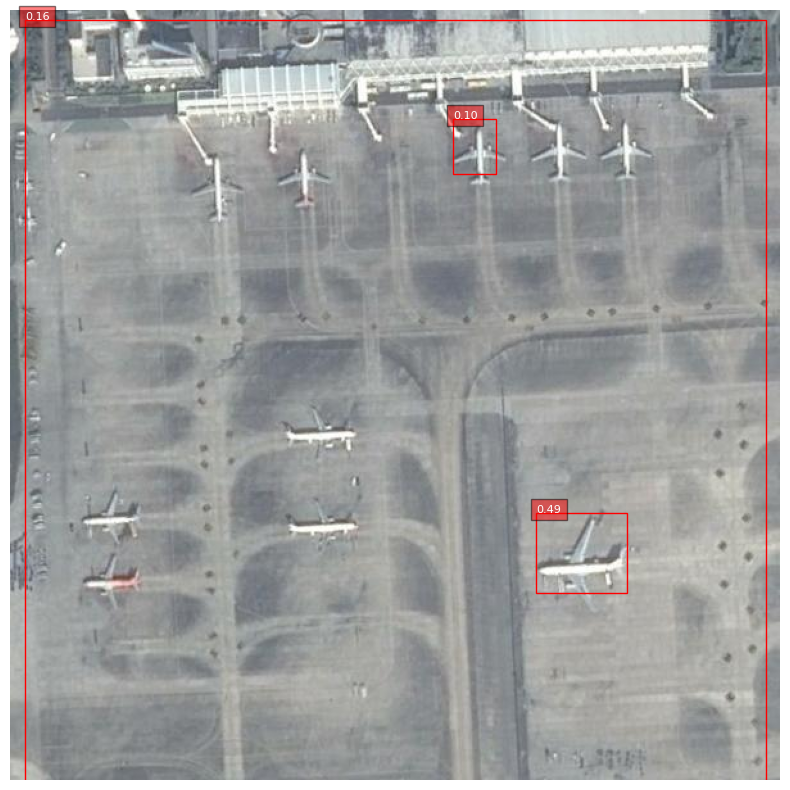

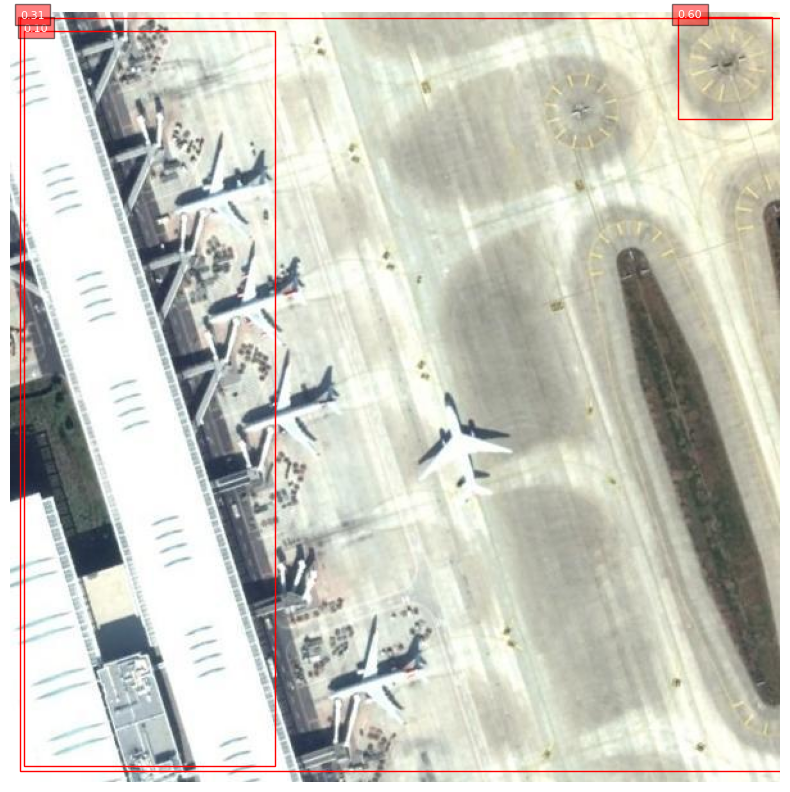

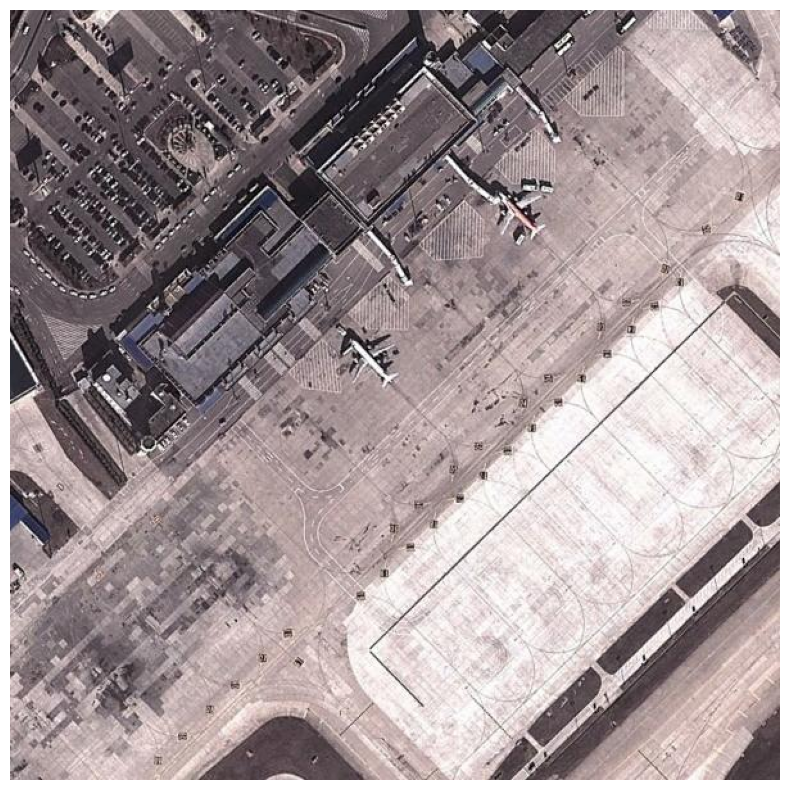

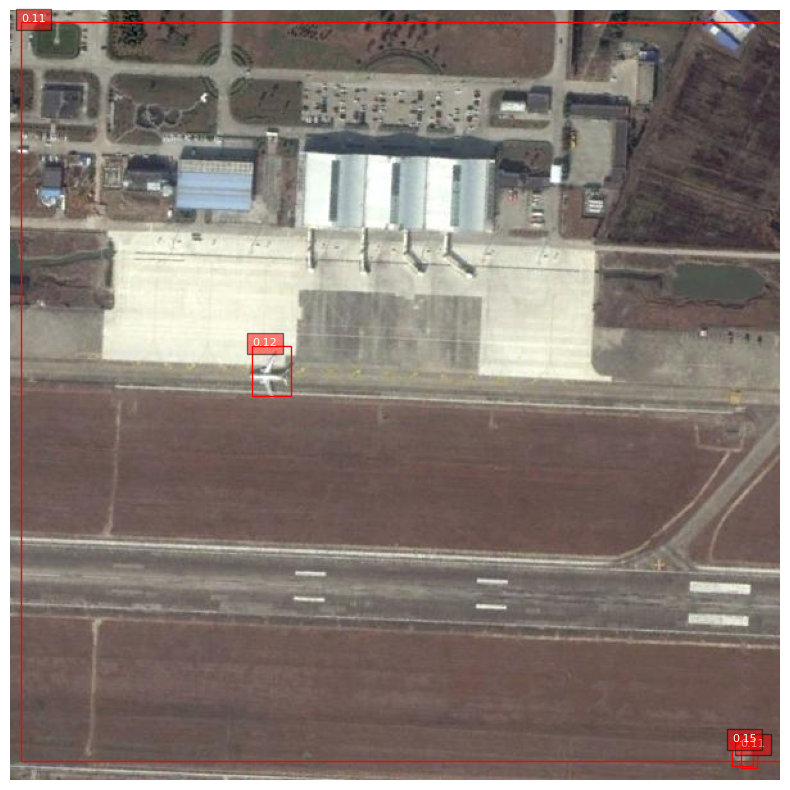

In [21]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

for result in all_results[10:15]:
    image_path = result['image_path']
    boxes = result['boxes']
    labels = result['labels']
    scores = result['scores']

    # # Cargar la imagen original
    # img = utils.prepare_input(image_path)
    # image = utils.prepare_tensor([img]).cpu().squeeze().permute(1, 2, 0).numpy()

    # Cargar la imagen original
    image = plt.imread(image_path)
    
    # Mostrar la imagen
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    ax.imshow(image)

    # Dibujar bounding boxes
    height, width, _ = image.shape
    for box, label, score in zip(boxes, labels, scores):
        x_min, y_min, x_max, y_max = box * [width, height, width, height]
        
        rect = patches.Rectangle(
            (x_min, y_min), x_max - x_min, y_max - y_min,
            linewidth=1, edgecolor='r', facecolor='none'
        )
        ax.add_patch(rect)
        
        if score is not None:
            label = f"{score:.2f}"
            ax.text(x_min, y_min, label, color = 'white', fontsize = 8, bbox=dict(facecolor = 'red', alpha = 0.5))
             

    plt.axis('off')
    plt.show()


## **Calculamos métricas para poder comparar posteriormente con el modelo finetuneado y con el modelo con data augmentation**

Definimos una función que hace uso de calc_iou_tensor (extraida directamente del github oficial de SSD)

In [22]:
def calc_iou_tensor(box1, box2):
    """ Calculation of IoU based on two boxes tensor,
        Reference to https://github.com/kuangliu/pytorch-src
        input:
            box1 (N, 4)
            box2 (M, 4)
        output:
            IoU (N, M)
    """
    N = box1.size(0)
    M = box2.size(0)

    be1 = box1.unsqueeze(1).expand(-1, M, -1)
    be2 = box2.unsqueeze(0).expand(N, -1, -1)

    # Left Top & Right Bottom
    lt = torch.max(be1[:,:,:2], be2[:,:,:2])
    #mask1 = (be1[:,:, 0] < be2[:,:, 0]) ^ (be1[:,:, 1] < be2[:,:, 1])
    #mask1 = ~mask1
    rb = torch.min(be1[:,:,2:], be2[:,:,2:])
    #mask2 = (be1[:,:, 2] < be2[:,:, 2]) ^ (be1[:,:, 3] < be2[:,:, 3])
    #mask2 = ~mask2

    delta = rb - lt
    delta[delta < 0] = 0
    intersect = delta[:,:,0]*delta[:,:,1]
    #*mask1.float()*mask2.float()

    delta1 = be1[:,:,2:] - be1[:,:,:2]
    area1 = delta1[:,:,0]*delta1[:,:,1]
    delta2 = be2[:,:,2:] - be2[:,:,:2]
    area2 = delta2[:,:,0]*delta2[:,:,1]

    iou = intersect/(area1 + area2 - intersect)
    return iou

In [23]:
def calculate_iou_per_image(pred_boxes, gt_boxes):
    """
    Calcula el IoU entre las predicciones y las anotaciones reales para una imagen.
    Args:
        pred_boxes: Tensor (N, 4) con las predicciones.
        gt_boxes: Tensor (M, 4) con las anotaciones reales.
    Returns:
        Tensor (N, M) con los IoUs.
    """
    if pred_boxes is None or gt_boxes is None:
        return torch.zeros((pred_boxes.size(0), gt_boxes.size(0)))
    
    # Convertir a tensores si no lo son
    if not isinstance(pred_boxes, torch.Tensor):
        pred_boxes = torch.tensor(pred_boxes, dtype=torch.float32)
    if not isinstance(gt_boxes, torch.Tensor):
        gt_boxes = torch.tensor(gt_boxes, dtype=torch.float32)
    
    # Verificar si están vacíos
    if pred_boxes.numel() == 0 or gt_boxes.numel() == 0:
        return torch.zeros((pred_boxes.size(0), gt_boxes.size(0)))

    # Calcular IoU
    return calc_iou_tensor(pred_boxes, gt_boxes)
    return calc_iou_tensor(pred_boxes, gt_boxes)


Definimos una función para hacer match entre las predicciones y el GT

In [24]:
def match_predictions_with_gt(pred_boxes, gt_boxes, iou_threshold=0.5):
    """
    Asigna predicciones a anotaciones reales utilizando IoU.
    Args:
        pred_boxes: Tensor (N, 4) con las predicciones.
        gt_boxes: Tensor (M, 4) con las anotaciones reales.
        iou_threshold: Umbral de IoU para considerar una predicción correcta.
    Returns:
        matches: Lista de pares (pred_idx, gt_idx) que coinciden.
        unmatched_preds: Índices de predicciones no emparejadas.
        unmatched_gts: Índices de anotaciones no emparejadas.
    """
    iou_matrix = calculate_iou_per_image(pred_boxes, gt_boxes)
    matches = []
    unmatched_preds = set(range(len(pred_boxes)))
    unmatched_gts = set(range(len(gt_boxes)))

    for pred_idx in range(len(pred_boxes)):
        iou_values = iou_matrix[pred_idx]
        best_gt_idx = iou_values.argmax().item()
        if iou_values[best_gt_idx] >= iou_threshold:
            matches.append((pred_idx, best_gt_idx))
            unmatched_preds.discard(pred_idx)
            unmatched_gts.discard(best_gt_idx)

    return matches, list(unmatched_preds), list(unmatched_gts)


Calculamos el resto de las métricas (precission, recall, F1-Score)

In [25]:
def calculate_metrics(matches, num_preds, num_gts):
    """
    Calcula Precision, Recall y F1-score.
    Args:
        matches: Lista de pares (pred_idx, gt_idx) que coinciden.
        num_preds: Número total de predicciones.
        num_gts: Número total de anotaciones reales.
    Returns:
        precision: Precisión del modelo.
        recall: Recall del modelo.
        f1_score: F1-score del modelo.
    """
    tp = len(matches)  # True Positives
    fp = num_preds - tp  # False Positives
    fn = num_gts - tp    # False Negatives

    precision = tp / (tp + fp) if tp + fp > 0 else 0
    recall = tp / (tp + fn) if tp + fn > 0 else 0
    f1_score = 2 * (precision * recall) / (precision + recall) if precision + recall > 0 else 0

    return precision, recall, f1_score


Función para normalizar las bb del GT


In [26]:
def normalize_annotations(annotation, image_width, image_height):
    """
    Normaliza las coordenadas de las anotaciones reales.
    Args:
        annotation: Diccionario con las anotaciones.
        image_width: Ancho de la imagen.
        image_height: Alto de la imagen.
    Returns:
        List of normalized boxes (xmin, ymin, xmax, ymax).
    """
    normalized_boxes = []
    for obj in annotation['annotations']:
        xmin = obj['xmin'] / image_width
        ymin = obj['ymin'] / image_height
        xmax = obj['xmax'] / image_width
        ymax = obj['ymax'] / image_height
        normalized_boxes.append([xmin, ymin, xmax, ymax])
    return torch.tensor(normalized_boxes, dtype=torch.float32)


Hacemos la evaluación

In [27]:
print(test_annotations)

[{'image_path': '/mnt/homeGPU/azapata/ZapataComputerVision/content/Aerial-Airport-1/test/airport_100_jpg.rf.f764c95324c38a84bc2af17b1243f913.jpg', 'annotations': [{'class': 'airplane', 'xmin': 540, 'ymin': 120, 'xmax': 554, 'ymax': 139}, {'class': 'airplane', 'xmin': 522, 'ymin': 123, 'xmax': 538, 'ymax': 145}, {'class': 'airplane', 'xmin': 508, 'ymin': 123, 'xmax': 520, 'ymax': 144}, {'class': 'airplane', 'xmin': 484, 'ymin': 141, 'xmax': 500, 'ymax': 156}, {'class': 'airplane', 'xmin': 470, 'ymin': 153, 'xmax': 488, 'ymax': 172}, {'class': 'airplane', 'xmin': 400, 'ymin': 224, 'xmax': 417, 'ymax': 241}, {'class': 'airplane', 'xmin': 439, 'ymin': 191, 'xmax': 454, 'ymax': 208}, {'class': 'airplane', 'xmin': 500, 'ymin': 179, 'xmax': 515, 'ymax': 193}, {'class': 'airplane', 'xmin': 448, 'ymin': 240, 'xmax': 464, 'ymax': 255}, {'class': 'airplane', 'xmin': 456, 'ymin': 231, 'xmax': 474, 'ymax': 245}, {'class': 'airplane', 'xmin': 476, 'ymin': 207, 'xmax': 495, 'ymax': 221}, {'class': 'a

In [28]:
metrics = []

for pred, gt in zip(all_results, test_annotations):
    image_path = pred['image_path']
    
    # Obtener dimensiones de la imagen
    image = plt.imread(image_path)
    height, width, _ = image.shape

    # Normalizar anotaciones reales
    gt_boxes = normalize_annotations(gt, width, height) if len(gt['annotations']) > 0 else torch.empty((0, 4))

    # Predicciones
    pred_boxes = pred['boxes'] if len(pred['boxes']) > 0 else torch.empty((0, 4))

    # Emparejar predicciones con anotaciones reales
    matches, unmatched_preds, unmatched_gts = match_predictions_with_gt(pred_boxes, gt_boxes)

    # Calcular métricas
    precision, recall, f1_score = calculate_metrics(matches, len(pred_boxes), len(gt_boxes))
    metrics.append((precision, recall, f1_score))

# Promediar métricas
mean_precision = sum(m[0] for m in metrics) / len(metrics)
mean_recall = sum(m[1] for m in metrics) / len(metrics)
mean_f1_score = sum(m[2] for m in metrics) / len(metrics)

print(f"Mean Precision: {mean_precision:.2f}")
print(f"Mean Recall: {mean_recall:.2f}")
print(f"Mean F1-score: {mean_f1_score:.2f}")


Mean Precision: 0.05
Mean Recall: 0.04
Mean F1-score: 0.03


# Fine Tuning

In [ ]:
ssd_model.

# Fine-Tuning al modelo para ver si las métricas mejoran

Cargamos SSD preentrenado (ssd300_vgg16), modificamos el número de clases para adaptarlo a nuestro dataset y lo preparamos en GPU.

In [29]:
import torch
from torchvision.models.detection import ssd300_vgg16

# Cargar el modelo SSD preentrenado
ssd_model = ssd300_vgg16(Weights=True)

# Modificar el número de clases (incluyendo el background como clase 0)
num_classes = len(classes_to_ids) + 1
ssd_model.head.classification_head.num_classes = num_classes

# Mover a GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
ssd_model.to(device)

# Mostrar estructura del modelo
print(ssd_model)


SSD(
  (backbone): SSDFeatureExtractorVGG(
    (features): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): ReLU(inplace=True)
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
      (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (13): ReLU(inplace=True)
      (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (15): ReLU(inplace=

In [30]:
# Configurar el optimizador
optimizer = torch.optim.Adam(ssd_model.parameters(), lr=1e-4, weight_decay=1e-4)

# Número de épocas
num_epochs = 10


In [31]:
for epoch in range(num_epochs):
    # Fase de entrenamiento
    ssd_model.train()
    train_loss = 0.0
    for images, targets in train_loader:
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        optimizer.zero_grad()
        loss_dict = ssd_model(images, targets)
        total_loss = sum(loss_dict.values())
        total_loss.backward()
        optimizer.step()

        train_loss += total_loss.item()

    print(f"Epoch {epoch+1}/{num_epochs}, Training Loss: {train_loss:.4f}")

    # Fase de validación
    ssd_model.eval()
    val_loss = 0.0
    metrics = []
    with torch.no_grad():
        for images, targets in val_loader:
            images = [img.to(device) for img in images]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            predictions = ssd_model(images)

            for pred, target in zip(predictions, targets):
                # Obtener predicciones y GT
                pred_boxes = pred['boxes']
                gt_boxes = target['boxes']
                image_shape = images[0].shape[1:]  # (height, width)

                # Normalizar GT boxes
                gt_boxes = gt_boxes if len(gt_boxes) > 0 else torch.empty((0, 4))
                pred_boxes = pred_boxes if len(pred_boxes) > 0 else torch.empty((0, 4))

                # Calcular IoU y métricas
                matches, unmatched_preds, unmatched_gts = match_predictions_with_gt(pred_boxes, gt_boxes)
                precision, recall, f1_score = calculate_metrics(matches, len(pred_boxes), len(gt_boxes))
                metrics.append((precision, recall, f1_score))

    # Calcular métricas promedio
    mean_precision = sum(m[0] for m in metrics) / len(metrics)
    mean_recall = sum(m[1] for m in metrics) / len(metrics)
    mean_f1_score = sum(m[2] for m in metrics) / len(metrics)

    print(f"Validation Metrics for Epoch {epoch+1}:")
    print(f"Mean Precision: {mean_precision:.2f}, Mean Recall: {mean_recall:.2f}, Mean F1-Score: {mean_f1_score:.2f}")



Epoch 1/10, Training Loss: 6478.5004
Validation Metrics for Epoch 1:
Mean Precision: 0.00, Mean Recall: 0.00, Mean F1-Score: 0.00
Epoch 2/10, Training Loss: 817.4610
Validation Metrics for Epoch 2:
Mean Precision: 0.00, Mean Recall: 0.00, Mean F1-Score: 0.00
Epoch 3/10, Training Loss: 564.4924
Validation Metrics for Epoch 3:
Mean Precision: 0.00, Mean Recall: 0.00, Mean F1-Score: 0.00
Epoch 4/10, Training Loss: 563.7279
Validation Metrics for Epoch 4:
Mean Precision: 0.00, Mean Recall: 0.00, Mean F1-Score: 0.00
Epoch 5/10, Training Loss: 566.0169
Validation Metrics for Epoch 5:
Mean Precision: 0.00, Mean Recall: 0.00, Mean F1-Score: 0.00
Epoch 6/10, Training Loss: 557.8167
Validation Metrics for Epoch 6:
Mean Precision: 0.02, Mean Recall: 0.00, Mean F1-Score: 0.00
Epoch 7/10, Training Loss: 551.9766
Validation Metrics for Epoch 7:
Mean Precision: 0.00, Mean Recall: 0.00, Mean F1-Score: 0.00
Epoch 8/10, Training Loss: 541.3312
Validation Metrics for Epoch 8:
Mean Precision: 0.00, Mean R

KeyboardInterrupt: 

## **Inferencia en datos de test**

Realizamos inferencia re imágenes de test uitilizando el modelo SSD preentrenado.

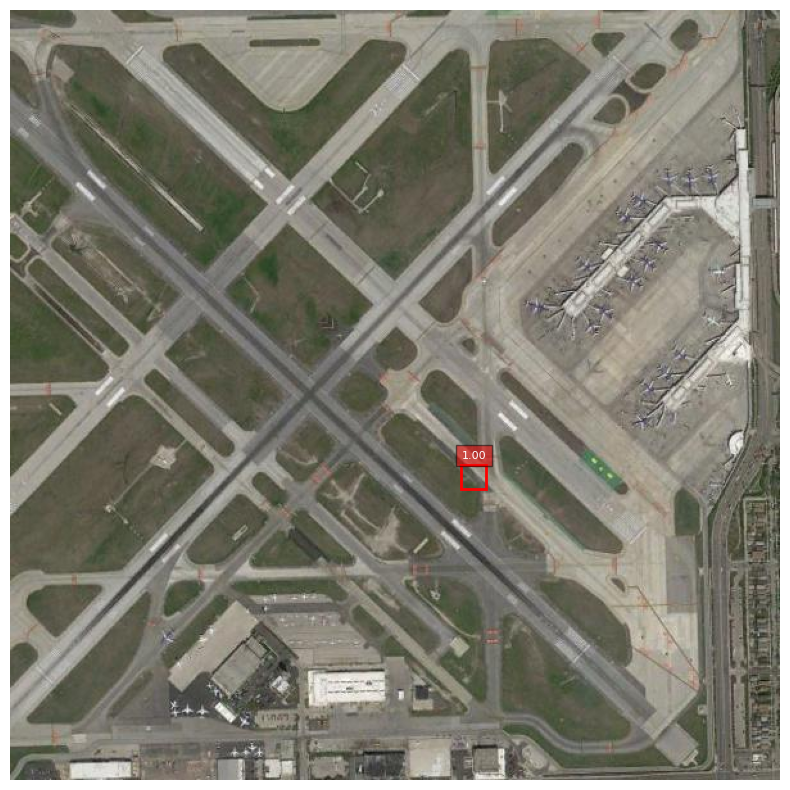

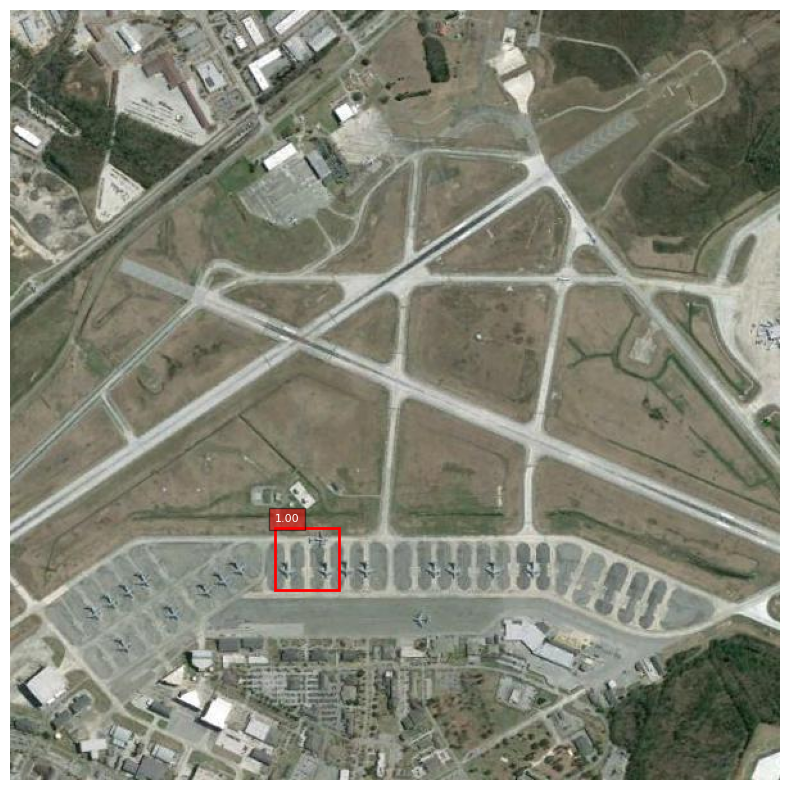

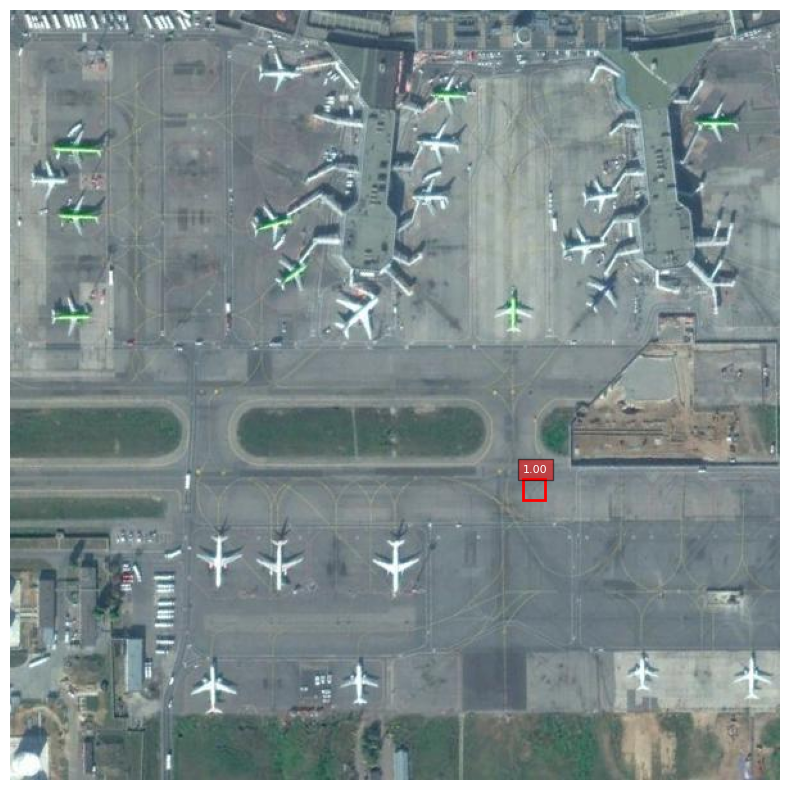

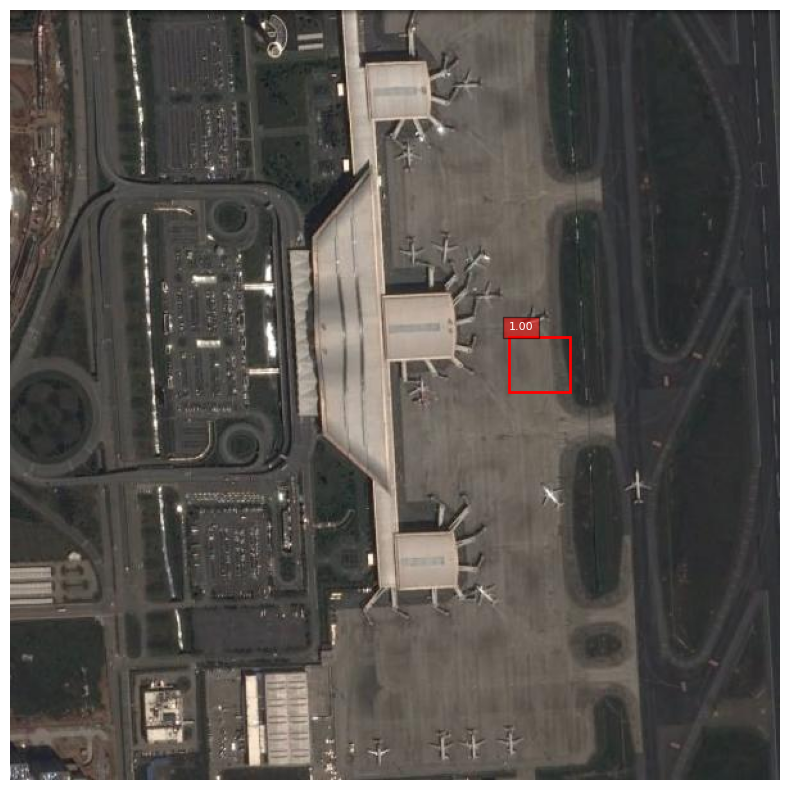

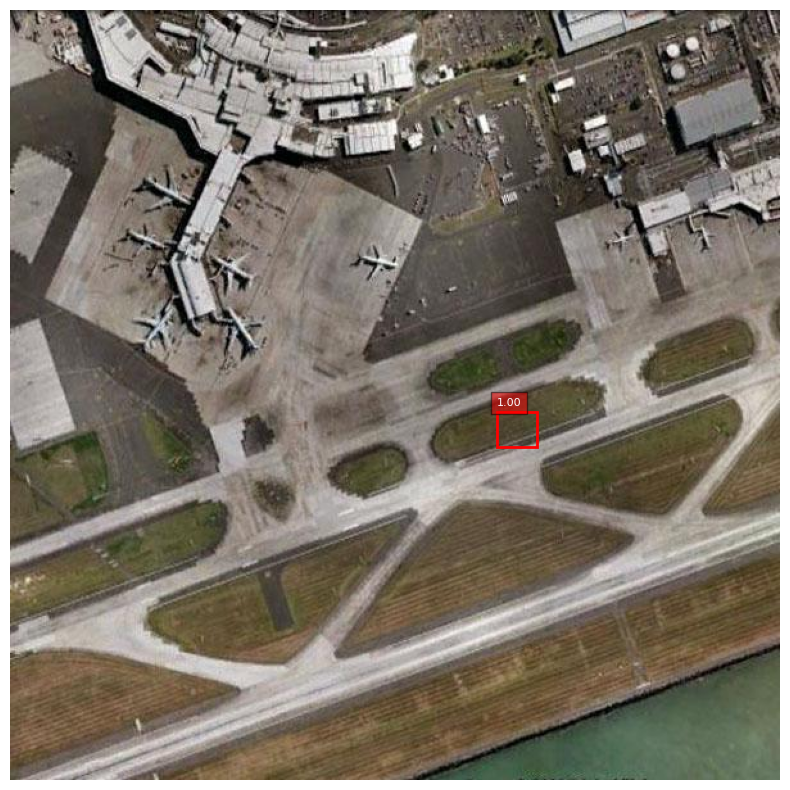

In [66]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from torchvision import transforms

# Definir el umbral para filtrar predicciones
threshold = 0.5  # Ajusta según sea necesario

# Procesar todas las imágenes del conjunto de test
all_results_finetuned = []

for annotation in test_annotations:
    image_path = annotation['image_path']
    image = Image.open(image_path).convert("RGB")

    # Transformar la imagen a tensor
    transform = transforms.Compose([transforms.ToTensor()])
    img_tensor = transform(image).unsqueeze(0).to(device)  # Agregar dimensión de batch

    with torch.no_grad():
        # Realizar inferencia
        predictions = ssd_model(img_tensor)[0]
        boxes = predictions['boxes'].cpu()
        labels = predictions['labels'].cpu()
        scores = predictions['scores'].cpu()

        # Filtrar predicciones por umbral
        valid_indices = scores > threshold
        boxes = boxes[valid_indices]
        labels = labels[valid_indices]
        scores = scores[valid_indices]

        # Guardar resultados
        all_results_finetuned.append({
            'image_path': image_path,
            'boxes': boxes,
            'labels': labels,
            'scores': scores
        })

# Visualización de resultados
for result in all_results_finetuned[:5]:  # Mostrar los primeros 5 resultados
    image_path = result['image_path']
    boxes = result['boxes']
    labels = result['labels']
    scores = result['scores']

    # Leer la imagen original
    image = plt.imread(image_path)
    height, width, _ = image.shape

    # Crear figura para visualización
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    ax.imshow(image)

    # Dibujar las bounding boxes
    for box, score in zip(boxes, scores):
        x_min, y_min, x_max, y_max = box.tolist()
        rect = patches.Rectangle(
            (x_min * width, y_min * height),
            (x_max - x_min) * width,
            (y_max - y_min) * height,
            linewidth=2,
            edgecolor='red',
            facecolor='none'
        )
        ax.add_patch(rect)
        ax.text(
            x_min * width, y_min * height - 5,  # Ajustar la posición del texto
            f"{score:.2f}",  # Mostrar el score
            color='white',
            fontsize=8,
            bbox=dict(facecolor='red', alpha=0.5)
        )

    # Mostrar imagen con anotaciones
    plt.axis('off')
    plt.show()
